In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler,MinMaxScaler

In [2]:
df=pd.read_csv('Compiled_data.csv')

In [3]:
df=df.iloc[:,1:]

In [4]:
df.Class.value_counts()

Class
2    292
0    146
1    146
Name: count, dtype: int64

In [5]:
df_copy=df.copy()

In [6]:
df=df.rank()

In [7]:
df

,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,nB,nN,nO,nS,...,E1s,E2s,E3s,Ts,As,Vs,Ks,Ds,IC50,Class
0,292.5,481.0,91.0,398.0,247.0,199.5,292.5,66.5,452.5,292.5,...,201.0,487.0,515.0,221.0,269.0,297.5,97.0,508.0,39.5,73.5
1,292.5,569.0,554.5,423.0,254.0,128.0,292.5,66.5,500.0,292.5,...,153.0,434.0,412.0,132.0,241.0,272.0,67.0,412.0,56.0,73.5
2,292.5,569.0,554.5,505.0,411.0,128.0,292.5,66.5,550.0,292.5,...,320.0,201.0,435.0,367.0,408.0,435.0,168.0,413.0,70.0,73.5
3,292.5,569.0,554.5,486.0,390.0,128.0,292.5,66.5,550.0,292.5,...,298.0,418.0,483.0,398.0,421.0,439.0,142.0,518.0,78.5,73.5
4,292.5,569.0,554.5,517.0,444.5,128.0,292.5,66.5,550.0,292.5,...,305.5,234.5,363.0,375.0,433.0,451.0,126.5,395.0,62.5,73.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
579,292.5,413.0,58.0,282.0,379.0,432.5,292.5,263.5,192.0,292.5,...,282.0,351.0,536.0,346.0,351.0,367.0,178.0,469.0,409.5,438.5
580,292.5,450.0,6.0,354.0,415.0,432.5,292.5,359.0,107.5,292.5,...,184.0,261.0,511.0,457.0,386.0,381.0,467.0,398.0,397.0,438.5
581,292.5,78.5,472.5,26.5,39.0,128.0,292.5,66.5,500.0,292.5,...,433.0,357.0,542.0,17.0,79.0,138.0,56.0,519.0,562.0,438.5
582,292.5,78.5,472.5,26.5,39.0,128.0,292.5,66.5,500.0,292.5,...,342.0,555.0,212.0,40.0,66.0,73.0,134.0,493.0,562.0,438.5


In [8]:
scaler=MinMaxScaler((0,500))

In [9]:
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import r2_score,mean_absolute_error,root_mean_squared_error

In [10]:
x=df.drop('IC50',axis=1)
y=df['IC50']

In [11]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)
x_train_trf=scaler.fit_transform(x_train)
x_test_trf=scaler.transform(x_test)

In [12]:
clf1=RandomForestRegressor(n_jobs=-1,n_estimators=100,criterion='absolute_error')
clf2=LinearRegression()
clf1.fit(x_train,y_train)

RandomForestRegressor(criterion='absolute_error', n_jobs=-1)

In [13]:
plt.rcParams['figure.dpi']=600

In [14]:
clf1=RandomForestRegressor(n_jobs=-1,n_estimators=100,criterion='absolute_error')
clf2=LinearRegression()
clf1.fit(x_train,y_train)

RandomForestRegressor(criterion='absolute_error', n_jobs=-1)

In [15]:
y_pred=clf1.predict(x_test_trf)

/home/avantika/soft_install/mamba/envs/myenv/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [16]:
r2_score(y_test,y_pred)

0.8908011638340705

Text(0, 0.5, 'Actual Rank')

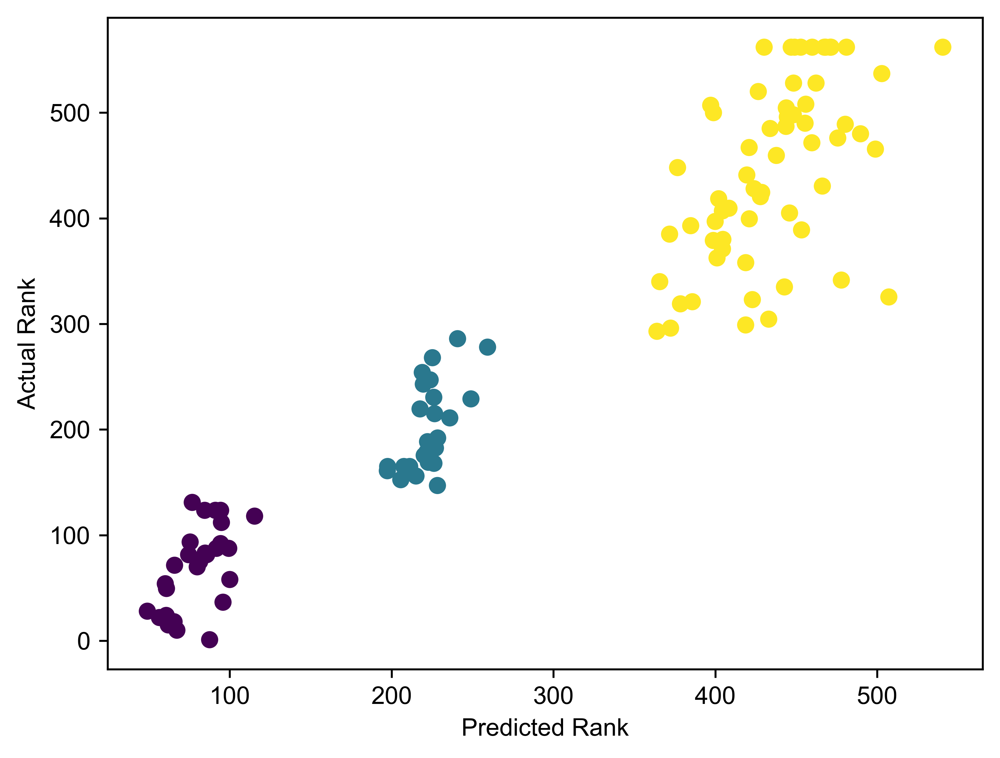

In [17]:
plt.scatter(x=y_pred,y=y_test,c=x_test['Class'])
plt.xticks(fontfamily='Arial',fontweight=21)
plt.yticks(fontfamily='Arial',fontweight=21)
plt.xlabel('Predicted Rank',fontweight=21,fontfamily='Arial')
plt.ylabel('Actual Rank',fontweight=21,fontfamily='Arial')

Text(0, 0.5, 'y_test')

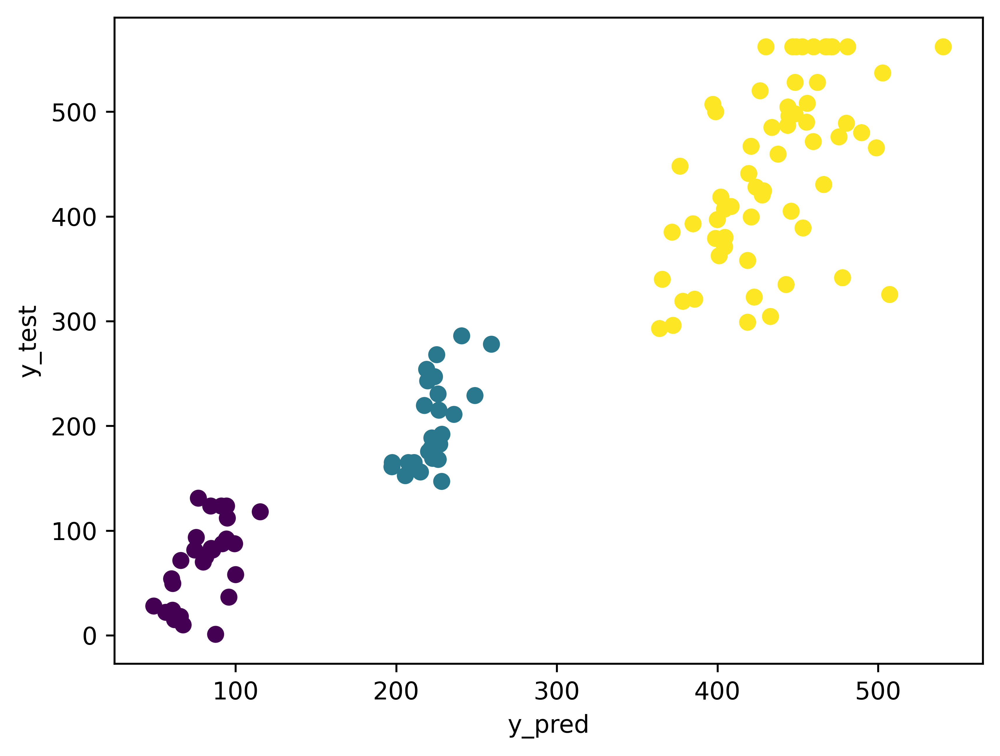

In [18]:
plt.scatter(x=y_pred,y=y_test,c=x_test['Class'])
plt.xlabel('y_pred')
plt.ylabel('y_test')

In [19]:
dit={'feature_name':df.drop('IC50',axis=1).columns,'importance':clf1.feature_importances_}

In [20]:
pd.DataFrame(dit).sort_values('importance',ascending=False)

,feature_name,importance
1634,Class,0.625875
322,SpMin2_Bhe,0.007644
903,gmin,0.006198
333,C1SP2,0.006011
1321,LOBMAX,0.005470
...,...,...
1078,nF8Ring,0.000000
1077,nF7Ring,0.000000
1076,nF6Ring,0.000000
1075,nF5Ring,0.000000


In [21]:
np.mean(cross_val_score(clf1,x_train,y_train,scoring='r2',cv=10))

np.float64(0.8941857761911726)

In [22]:
df_testing=pd.concat([x_test,y_test],axis=1)

In [23]:
mask1=df_testing['Class']==73.5
mask2=df_testing['Class']==219.5

In [24]:
x_testing=df_testing[mask1|mask2].drop('IC50',axis=1)
y_testing=df_testing[mask1|mask2]['IC50']

In [25]:
listing=x_testing.index.tolist()

In [26]:
y_prediction=clf1.predict(x_testing)

In [27]:
rf_error=mean_absolute_error(y_pred,y_test)

In [28]:
lst_imp=clf1.feature_importances_

In [29]:
dict={'Feature': x_train.columns , 'importance': clf1.feature_importances_}

In [30]:
df_importances=pd.DataFrame(dict).sort_values('importance',ascending=False)

In [31]:
df_importances.to_csv('feature_importance.csv')

In [32]:
df_importances.set_index('Feature',inplace=True)

In [33]:
abs(df_importances['importance']).sort_values(ascending=False).head(30)

Feature
Class         0.625875
SpMin2_Bhe    0.007644
gmin          0.006198
C1SP2         0.006011
LOBMAX        0.005470
TDB2e         0.005124
R_TpiPCTPC    0.004533
TDB2u         0.004436
LOBMIN        0.004418
SaaCH         0.004186
Du            0.003621
SpMin2_Bhs    0.002959
TDB1u         0.002443
VE3_Dt        0.002266
SpMin1_Bhv    0.002119
TDB1i         0.002070
JGI3          0.001938
TDB3i         0.001935
piPC5         0.001778
hmax          0.001653
TDB5s         0.001653
JGI4          0.001462
E3m           0.001456
SpMax1_Bhm    0.001401
TDB2s         0.001363
RDF20v        0.001352
RDF65m        0.001331
GATS3v        0.001292
E2m           0.001250
geomShape     0.001250
Name: importance, dtype: float64

In [34]:
x_test[abs(df_importances['importance']).sort_values(ascending=False).head(10).index.to_list()]

,Class,SpMin2_Bhe,gmin,C1SP2,LOBMAX,TDB2e,R_TpiPCTPC,TDB2u,LOBMIN,SaaCH
383,438.5,239.0,399.0,540.5,140.0,418.0,152.0,319.0,141.0,383.0
422,438.5,562.5,160.0,105.0,220.0,532.0,555.5,492.0,234.0,325.0
90,219.5,380.0,259.5,105.0,326.0,272.0,144.0,211.0,357.0,137.0
472,438.5,29.5,98.0,312.0,94.0,153.0,48.0,368.0,87.0,15.0
522,219.5,434.0,474.0,312.0,1.0,62.0,351.5,332.0,2.0,370.0
...,...,...,...,...,...,...,...,...,...,...
296,438.5,276.0,561.0,312.0,10.0,73.0,304.0,437.0,19.0,487.0
560,73.5,528.0,232.0,540.5,537.0,46.0,264.0,104.0,540.0,412.0
167,438.5,562.5,218.0,105.0,344.5,225.0,482.0,225.5,329.0,503.0
559,73.5,396.0,177.0,468.5,188.0,139.0,184.0,13.0,205.0,202.0


In [35]:
lst=[]
for i in range(1,101):
    lst.append(np.mean(cross_val_score(clf1,x_train[abs(df_importances['importance']).sort_values(ascending=False).head(i).index.to_list()],y_train,scoring='r2',cv=10)))


In [36]:
plt.figure(figsize=(18, 20))
plt.plot([m for m in range(1,101)],lst,color='seagreen', linestyle='-', linewidth=4)
plt.xlabel('Number of features',fontfamily='Arial',fontsize=30, fontweight='bold')
plt.ylabel('R2_score',fontfamily='Arial',fontsize=30, fontweight='bold')
plt.xticks(fontfamily='Arial', fontsize=30, fontweight='bold')
plt.yticks(fontfamily='Arial',fontsize=30, fontweight='bold')
plt.savefig('topdescriptors_model2.png', dpi=600, format='png')

In [37]:
max(lst)

np.float64(0.9067856826097591)

In [38]:
lst_ic50=pd.read_csv('Compiled_data.csv')['IC50'].to_list()

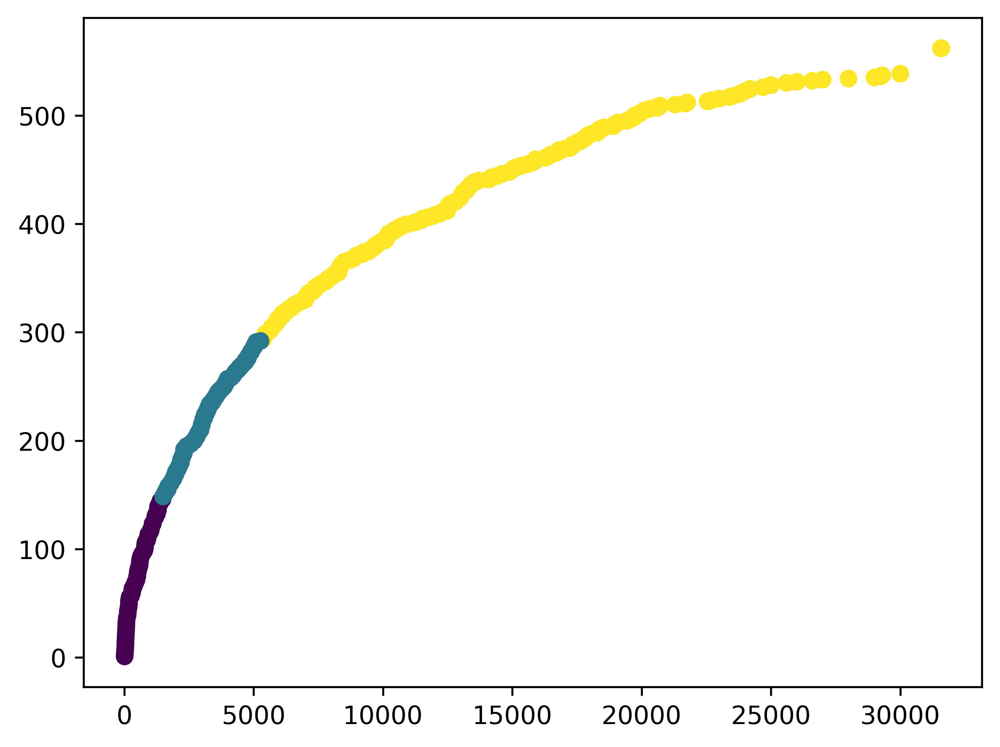

In [39]:
plt.scatter(y=df['IC50'],x=lst_ic50,c=df['Class'])

In [40]:
mean_absolute_error(y_test,y_pred)

45.13106837606838

In [41]:
df_intercept=pd.DataFrame({'rank':df['IC50'],'actual':lst_ic50})

In [42]:
df_intercept.to_excel('calculate_slope.xlsx')

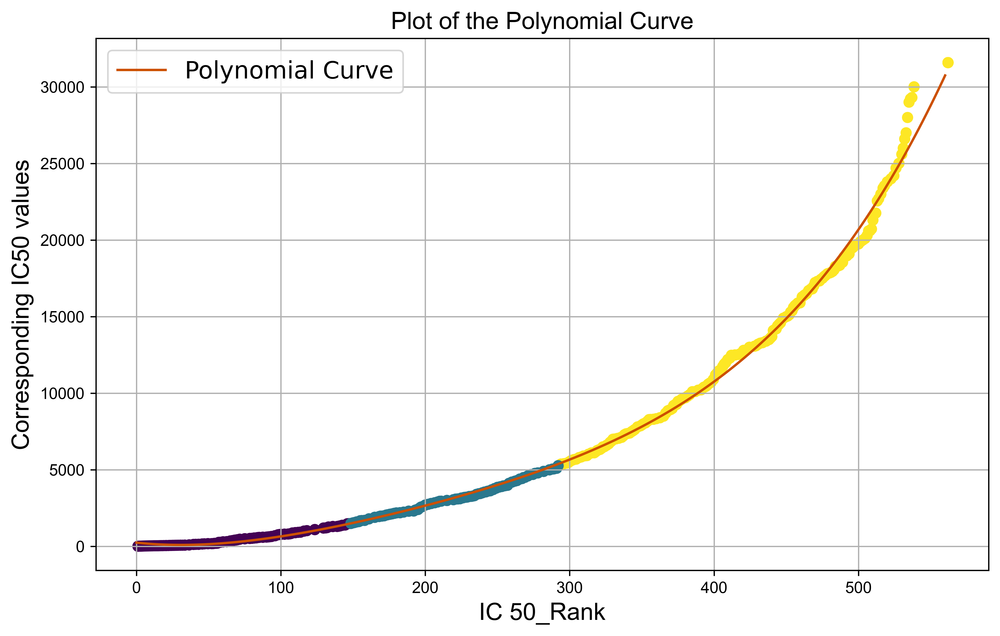

In [43]:
coefficients = [7e-7, -0.00052, 0.1870, -10.123, 248.08]
x_values = np.linspace(0, 560, 400)
y_values = np.polyval(coefficients, x_values)
plt.figure(figsize=(10, 6))
plt.plot(x_values, y_values, label='Polynomial Curve',color='#cc5000')
plt.xlabel('IC 50_Rank',fontsize=15,fontfamily='Arial')
plt.ylabel('Corresponding IC50 values',fontsize=15,fontfamily='Arial')
plt.title('Plot of the Polynomial Curve',fontsize=15,fontfamily='Arial')
plt.legend(fontsize=15)
plt.scatter(x=df['IC50'],y=lst_ic50,c=df['Class'])
plt.grid(True)
plt.xticks(fontfamily='Arial',fontweight=21)
plt.yticks(fontfamily='Arial',fontweight=21)
plt.show()

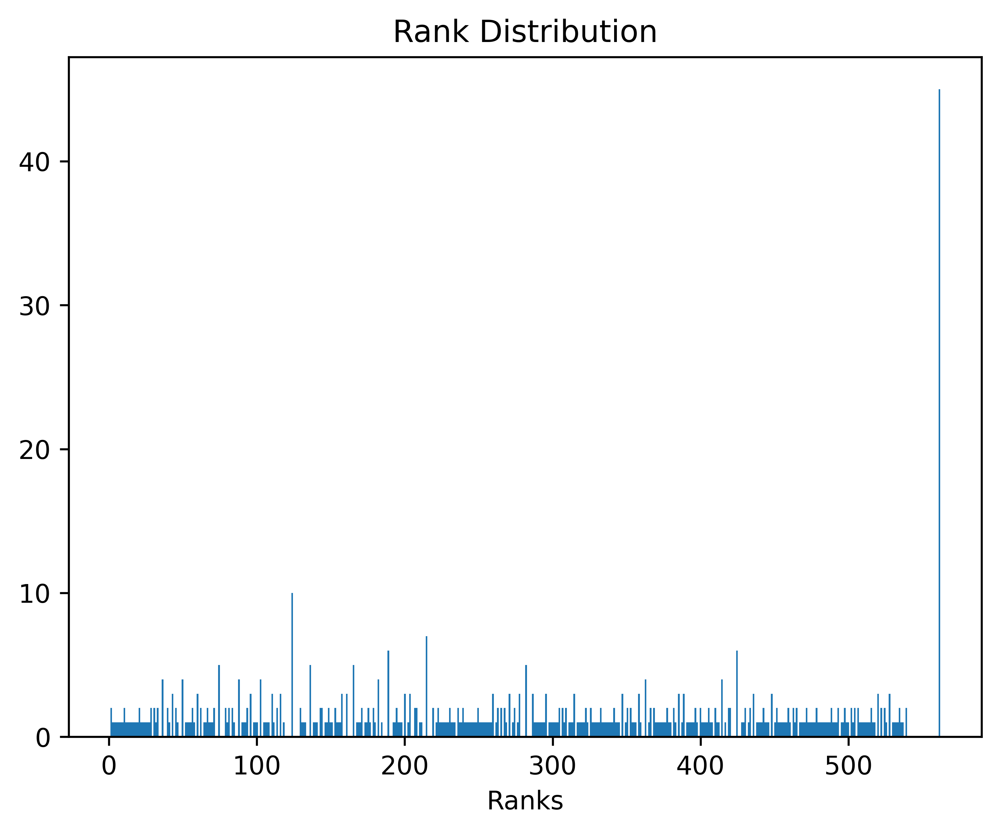

In [44]:
plt.hist(df['IC50'], bins=500)
plt.title('Rank Distribution')
plt.xlabel('Ranks')
plt.show()

In [45]:
coefficients = [7e-7, -0.00052, 0.1870, -10.123, 248.08]
x_values = y_prediction
y_values = np.polyval(coefficients, x_values)

In [46]:
listing

[90,
 522,
 261,
 542,
 70,
 565,
 184,
 208,
 2,
 555,
 63,
 55,
 446,
 29,
 423,
 248,
 319,
 547,
 247,
 176,
 10,
 425,
 6,
 487,
 496,
 489,
 101,
 72,
 196,
 546,
 76,
 334,
 30,
 73,
 298,
 249,
 39,
 60,
 545,
 11,
 86,
 453,
 439,
 274,
 277,
 140,
 523,
 199,
 9,
 245,
 84,
 543,
 182,
 560,
 559]

In [47]:
lst=pd.read_csv('Compiled_data.csv')['IC50'].loc[listing]

In [48]:
lst

90     1900.00
522    3600.00
261    1800.00
542    1210.00
70     1979.00
565      12.21
184    3050.00
208     550.00
2       440.00
555      46.12
63      100.00
55     1950.00
446    3710.00
29       66.00
423    4800.00
248     600.00
319     270.00
547    2160.00
247    1100.00
176    3950.00
10      500.00
425    2200.00
6       650.00
487    1490.00
496    1030.00
489    2100.00
101    1100.00
72     2954.00
196     630.00
546    2300.00
76     4494.00
334    5000.00
30       60.00
73     2126.00
298    1100.00
249     600.00
39       75.00
60      180.00
545    1690.00
11      500.00
86     1600.00
453    3220.00
439    2310.00
274     200.00
277     470.00
140    3000.00
523    1900.00
199     550.00
9       560.00
245    1900.00
84      920.00
543    3260.00
182    2070.00
560      38.96
559      51.81
Name: IC50, dtype: float64

In [49]:
pd.DataFrame({'Real_val':lst,"pred_val":y_values})

,Real_val,pred_val
90,1900.00,2734.658170
522,3600.00,3150.341766
261,1800.00,2522.639319
542,1210.00,184.670520
70,1979.00,3430.977106
565,12.21,409.779051
184,3050.00,3109.825702
208,550.00,452.147769
2,440.00,308.110866
555,46.12,120.838865


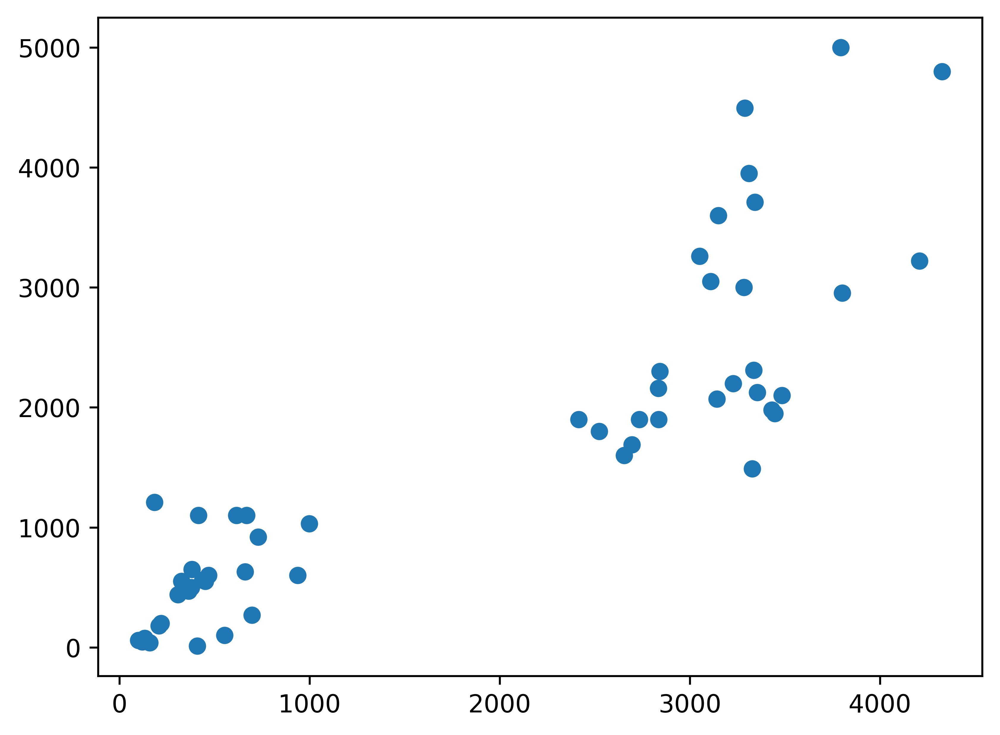

In [50]:
plt.scatter(y_values,lst)

In [51]:
from sklearn.metrics import matthews_corrcoef

In [52]:
def relative_error(true_value, approx_value):
  return abs(true_value - approx_value) / abs(true_value)

In [53]:
np.mean(relative_error(y_values,lst))

np.float64(0.4773411268817867)

In [54]:
mean_absolute_error(y_values,lst)

543.0744294188017

In [55]:
df['IC50'].value_counts()

IC50
562.0    45
123.5    10
215.0     7
188.5     6
424.5     6
         ..
317.0     1
354.0     1
300.0     1
174.0     1
68.0      1
Name: count, Length: 375, dtype: int64

In [56]:
import seaborn as sns

<Axes: xlabel='IC50', ylabel='count'>

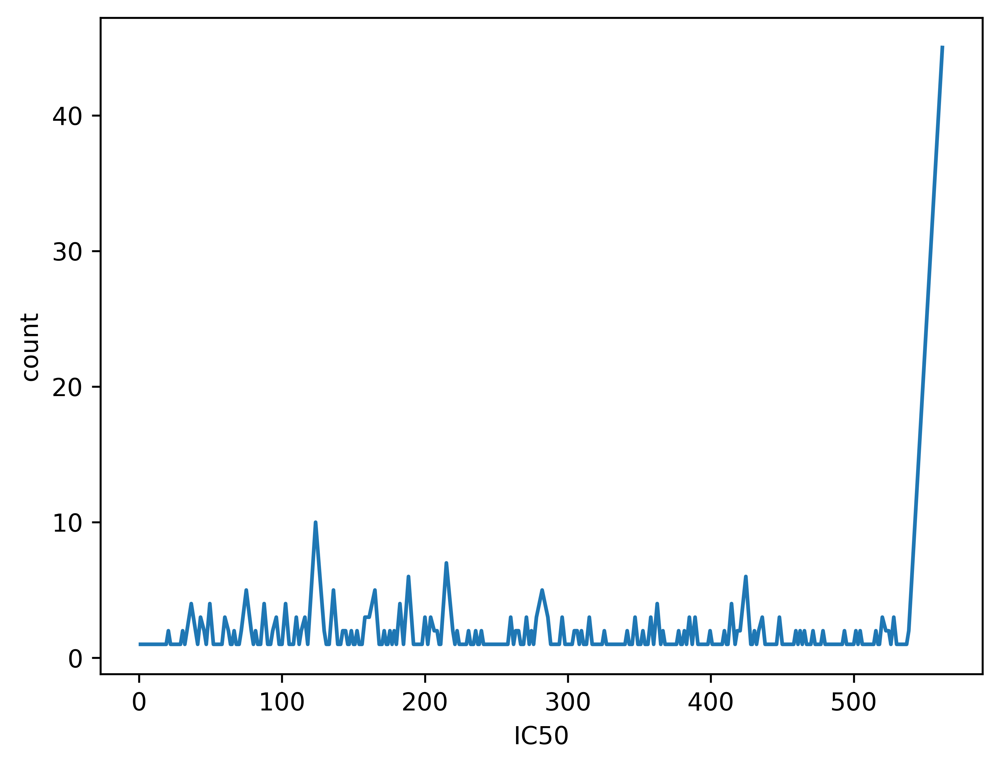

In [57]:
sns.lineplot(df['IC50'].value_counts())

In [58]:
llm=df_importances.head(45).index.tolist()

In [59]:
df[llm]

,Class,SpMin2_Bhe,gmin,C1SP2,LOBMAX,TDB2e,R_TpiPCTPC,TDB2u,LOBMIN,SaaCH,...,VE2_Dt,TDB2i,E3e,ETA_Beta_ns,E2u,GATS7c,SpMax3_Bhm,SpMax1_Bhv,TDB8i,GATS7m
0,73.5,520.0,35.0,105.0,154.0,298.0,169.0,274.0,155.0,80.0,...,224.0,183.0,500.5,326.0,504.0,337.0,306.0,107.0,219.0,82.0
1,73.5,375.0,35.0,105.0,126.0,317.0,116.0,323.0,119.0,64.0,...,87.0,178.0,408.0,326.0,417.0,89.0,297.0,60.0,43.0,524.0
2,73.5,369.0,35.0,312.0,168.0,340.0,92.0,117.0,145.0,56.0,...,40.0,102.5,419.0,369.5,215.0,66.0,375.0,74.0,158.0,407.0
3,73.5,364.0,35.0,312.0,311.0,276.0,103.0,179.0,291.0,54.0,...,83.0,60.0,492.0,369.5,388.0,134.0,385.0,71.0,179.0,547.0
4,73.5,369.0,35.0,312.0,204.0,326.5,83.0,138.5,181.0,61.0,...,20.0,128.0,329.5,369.5,254.0,21.0,372.0,76.0,143.0,185.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
579,438.5,423.0,489.0,105.0,138.0,169.0,268.0,242.0,142.0,515.0,...,179.0,457.0,527.0,369.5,358.0,580.0,411.0,147.0,252.0,538.0
580,438.5,464.0,490.0,105.0,322.0,160.0,260.0,250.0,335.0,518.0,...,92.0,506.0,509.0,369.5,319.0,580.0,425.0,172.0,381.0,542.0
581,438.5,146.0,134.0,105.0,246.0,556.0,555.5,563.0,266.0,92.0,...,117.0,27.0,548.0,274.0,152.0,104.0,144.0,543.0,324.0,257.0
582,438.5,145.0,127.0,105.0,476.0,552.0,555.5,557.0,477.0,101.0,...,195.0,17.0,204.0,274.0,528.0,175.0,140.0,545.0,518.0,477.0


In [60]:
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.ensemble import HistGradientBoostingRegressor

In [61]:
clf3=SVR(kernel='poly',degree=6)
clf3.fit(x_train,y_train)
y_pred3=clf3.predict(x_test)

In [62]:
r2_3=r2_score(y_test,y_pred3)

In [63]:
r2_3

0.7270971407546699

In [64]:
r2_1=r2_score(y_test,y_pred)

In [65]:
r2_1

0.8908011638340705

In [66]:
clf2=HistGradientBoostingRegressor(max_depth=3)

In [67]:
clf2.fit(x_train,y_train)
y_pred2=clf2.predict(x_test)

In [68]:
r2_2=r2_score(y_test,y_pred2)

In [69]:
clf4=XGBRegressor()
clf4.fit(x_train,y_train)
y_pred4=clf4.predict(x_test)

In [70]:
r2_4=r2_score(y_test,y_pred4)

In [71]:
r2_4

0.8719246154195459

In [72]:
new_df=df[llm]

In [73]:
new_df['IC50']=df['IC50']

/tmp/ipykernel_409008/2838705691.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['IC50']=df['IC50']


In [74]:
x=new_df.drop('IC50',axis=1)
y=new_df['IC50']
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

In [75]:
clf1=RandomForestRegressor(n_jobs=-1,n_estimators=200)
clf1.fit(x_train,y_train)
y_pred=clf1.predict(x_test)
r2_1=r2_score(y_test,y_pred)

In [76]:
r2_1

0.9052139086007247

In [77]:
clf2.fit(x_train,y_train)
y_pred2=clf2.predict(x_test)
r2_2=r2_score(y_test,y_pred2)

In [78]:
r2_2

0.9067476777938963

In [79]:
clf3.fit(x_train,y_train)
y_pred3=clf3.predict(x_test)
r2_3=r2_score(y_test,y_pred3)

In [80]:
r2_3

0.74769782297299

In [81]:
clf4.fit(x_train,y_train)
y_pred4=clf4.predict(x_test)
r2_4=r2_score(y_test,y_pred4)

In [82]:
r2_4

0.8894072996140618

In [83]:
from sklearn.metrics import root_mean_squared_error

In [84]:
rf_error=root_mean_squared_error(y_pred,y_test)
hist_error=root_mean_squared_error(y_pred2,y_test)
SVR_error=root_mean_squared_error(y_pred3,y_test)
XGB_error=root_mean_squared_error(y_pred4,y_test)

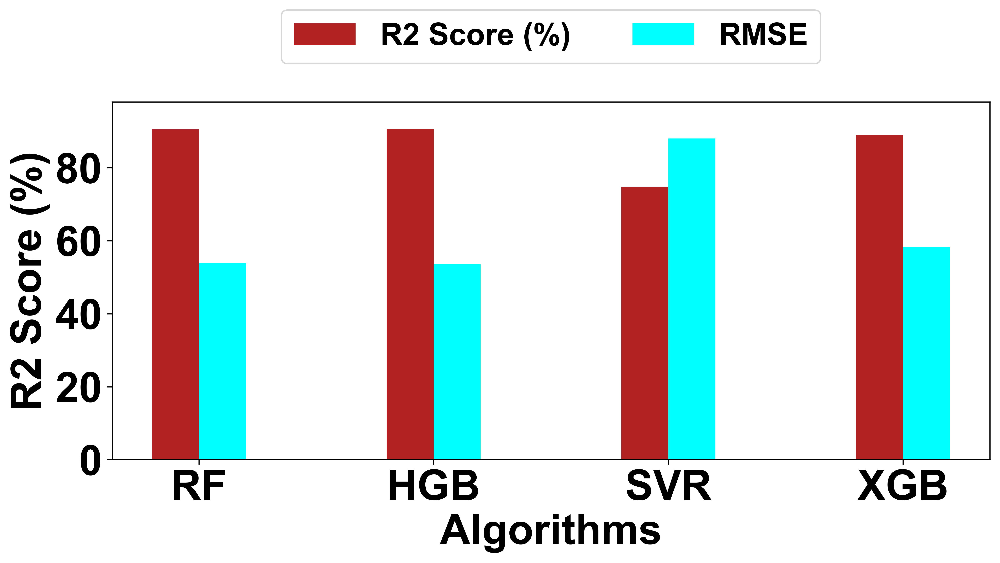

In [85]:
import numpy as np
import matplotlib.pyplot as plt

# Assume r2_1 to r2_4 and error values are already defined earlier in your code
r2_scores = [r2_1, r2_2, r2_3, r2_4]
errors = [rf_error, hist_error, SVR_error, XGB_error]
algorithms = ['RF', 'HGB', 'SVR', 'XGB']
x = np.arange(len(algorithms))

plt.figure(figsize=(10, 6))
# Convert R2 values to percentage dynamically
r2_percent = [score * 100 for score in r2_scores]
plt.bar(x - 0.1, height=r2_percent, color='firebrick', label='R2 Score (%)', width=0.2)
plt.bar(x + 0.1, height=errors, color='cyan', label='RMSE', width=0.2)

plt.xlabel('Algorithms', fontfamily='Arial', fontweight='bold', fontsize=30)
plt.ylabel('R2 Score (%)', fontfamily='Arial', fontweight='bold', fontsize=30)
plt.xticks(x, algorithms, fontfamily='Arial', fontweight='bold', fontsize=30)
plt.yticks(fontfamily='Arial', fontweight='bold', fontsize=30)
plt.xticks(rotation=0)

plt.legend()
plt.legend(
    ncol=2,
    loc='upper center',
    bbox_to_anchor=(0.5, 1.3),
    prop={'family': 'Arial', 'weight':'bold','size':22},
)

plt.ylim(0, max(max(r2_scores), max(errors)) + 10)  # Adjusting y-limit for clarity
plt.tight_layout()
plt.savefig('accuracy_model3.png.png.png', dpi=600, format='png')
plt.show()

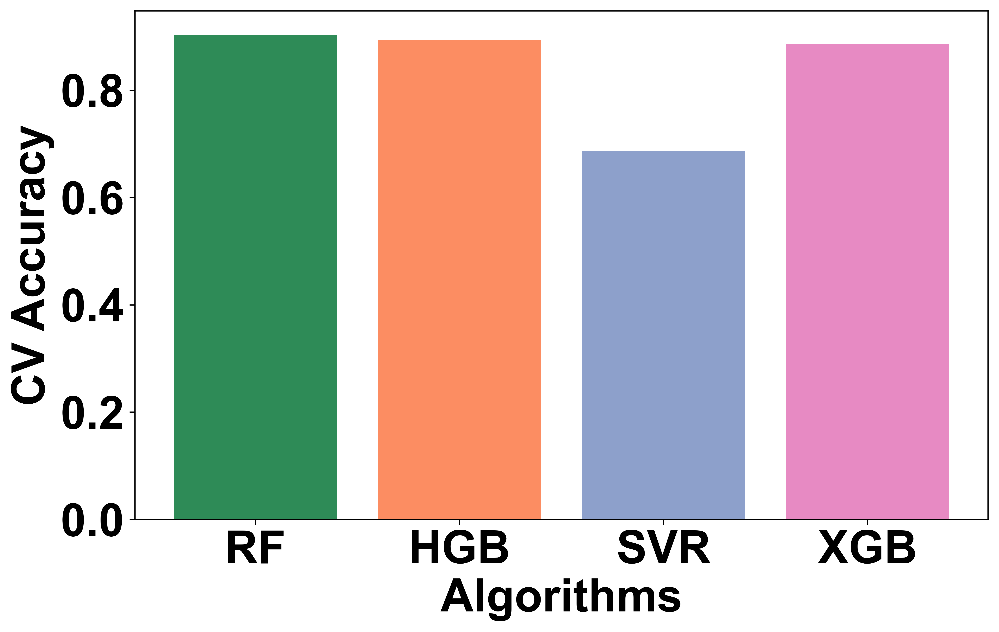

In [86]:
# Cross-validation scores for each model
cv_scores = {
    'RF': np.mean(cross_val_score(clf1, x_train, y_train, scoring='r2', cv=10)),
    'HGB': np.mean(cross_val_score(clf2, x_train, y_train, scoring='r2', cv=10)),
    'SVR': np.mean(cross_val_score(clf3, x_train, y_train, scoring='r2', cv=10)),
    'XGB': np.mean(cross_val_score(clf4, x_train, y_train, scoring='r2', cv=10))
}

# Plotting the bar plot
plt.figure(figsize=(10, 6))
bars = plt.bar(cv_scores.keys(), cv_scores.values(), color=['#2E8B57', '#fc8d62', '#8da0cb', '#e78ac3'])  # uniform color

plt.xlabel('Algorithms',fontfamily='Arial', fontweight='bold', fontsize=30)
plt.ylabel('CV Accuracy', fontfamily='Arial', fontweight='bold', fontsize=30)
plt.xticks(fontfamily='Arial', fontweight='bold', fontsize=30)
plt.yticks(fontfamily='Arial', fontweight='bold', fontsize=30)

plt.savefig('cv_model3.png', dpi=600, format='png')
plt.show()

In [87]:
import numpy as np
import pandas as pd
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor, HistGradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.experimental import enable_hist_gradient_boosting
import xgboost as xgb

# Initialize models
models = {
    'Random Forest': RandomForestRegressor(),
    'Hist Gradient Boost': HistGradientBoostingRegressor(),
    'SVR': SVR(),
    'XGBoost': xgb.XGBRegressor()
}

# Store results
results = []

for name, model in models.items():
    # Fit and predict
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    
    # Calculate metrics
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    
    # Cross-validation
    cv_scores = cross_val_score(model, x_train, y_train, 
                              scoring='r2', cv=10)
    cv_mean = cv_scores.mean()
    cv_std = cv_scores.std()
    
    # Format CV results
    cv_formatted = f"{cv_mean:.3f} ± {cv_std:.3f}"
    
    # Append results
    results.append({
        'Model': name,
        'Test R²': r2,
        'Test RMSE': rmse,
        'CV R² (Mean ± Std)': cv_formatted,
        'CV Scores Raw': cv_scores  # Keep raw scores for reference
    })

# Create DataFrame
results_df = pd.DataFrame(results).set_index('Model')

# Save and display
results_df.to_csv('regression_model_comparison.csv', 
                 columns=['Test R²', 'Test RMSE', 'CV R² (Mean ± Std)'])
print(results_df[['Test R²', 'Test RMSE', 'CV R² (Mean ± Std)']])

# Optional: Print full CV scores for analysis
print("\nDetailed CV Scores:")
for res in results:
    print(f"\n{res['Model']} CV Scores:")
    print([f"{x:.3f}" for x in res['CV Scores Raw']])

/home/avantika/soft_install/mamba/envs/myenv/lib/python3.10/site-packages/sklearn/experimental/enable_hist_gradient_boosting.py:19: UserWarning: Since version 1.0, it is not needed to import enable_hist_gradient_boosting anymore. HistGradientBoostingClassifier and HistGradientBoostingRegressor are now stable and can be normally imported from sklearn.ensemble.
  warnings.warn(


                      Test R²   Test RMSE CV R² (Mean ± Std)
Model                                                       
Random Forest        0.905103   54.002996      0.901 ± 0.019
Hist Gradient Boost  0.899724   55.512259      0.902 ± 0.018
SVR                  0.072788  168.802999      0.037 ± 0.034
XGBoost              0.889407   58.298033      0.887 ± 0.025

Detailed CV Scores:

Random Forest CV Scores:
['0.863', '0.876', '0.903', '0.900', '0.905', '0.902', '0.933', '0.924', '0.899', '0.906']

Hist Gradient Boost CV Scores:
['0.871', '0.881', '0.898', '0.895', '0.900', '0.906', '0.920', '0.936', '0.902', '0.912']

SVR CV Scores:
['0.060', '0.049', '0.044', '0.024', '0.063', '-0.038', '0.070', '0.058', '-0.011', '0.053']

XGBoost CV Scores:
['0.860', '0.888', '0.908', '0.842', '0.881', '0.886', '0.921', '0.928', '0.885', '0.872']


In [88]:
import numpy as np
import pandas as pd
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.experimental import enable_hist_gradient_boosting  # noqa
from sklearn.ensemble import HistGradientBoostingRegressor
import xgboost as xgb

# Assuming your regression models are defined as clf1, clf2, clf3, clf4
# Define the models
clf1 = RandomForestRegressor()
clf2 = HistGradientBoostingRegressor()
clf3 = SVR()
clf4 = xgb.XGBRegressor()

# Assuming x_train, y_train, x_test, y_test are already defined from your dataset
# Example: x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit models and make predictions for performance metrics
models = [clf1, clf2, clf3, clf4]
model_names = ['RF', 'HGB', 'SVR', 'XGB']
accuracy = []
rmse = []
cv_means = []
cv_stds = []

for model in models:
    model.fit(x_train, y_train)
    
    # Predictions for R2 and RMSE
    predictions = model.predict(x_test)
    accuracy.append(r2_score(y_test, predictions))  # R2 as accuracy for regression
    rmse.append(np.sqrt(mean_squared_error(y_test, predictions)))
    
    # Cross-validation scores
    cv_score = cross_val_score(model, x_train, y_train, scoring='r2', cv=10)
    cv_means.append(np.mean(cv_score))
    cv_stds.append(np.std(cv_score))

# Create a DataFrame to save the results
df = pd.DataFrame({
    'Model': model_names,
    'R2 Accuracy': accuracy,
    'RMSE': rmse,
    'CV Mean': cv_means,
    'CV Std': cv_stds
})

# Save to CSV
df.to_csv('model_performance_regression.csv', index=False)

# Display the table
print(df)


  Model  R2 Accuracy        RMSE   CV Mean    CV Std
0    RF     0.905547   53.876500  0.902181  0.022980
1   HGB     0.899724   55.512259  0.902041  0.017656
2   SVR     0.072788  168.802999  0.037193  0.033545
3   XGB     0.889407   58.298033  0.886923  0.025155


In [89]:
import matplotlib.pyplot as plt
import seaborn as sns

# Top 45 features by absolute importance
top_45_features = df_importances.loc[
    df_importances['importance'].abs().sort_values(ascending=False).head(45).index
].copy()

# Handle 'Class' dominance if present
if 'Class' in top_45_features.index:
    max_non_class = top_45_features.drop('Class')['importance'].max()
    top_45_features.loc['Class', 'importance'] = max_non_class * 1.5

# Normalize importance values
top_45_features["importance_norm"] = top_45_features["importance"] / top_45_features["importance"].max()

# Prepare sorted versions
top_45_with_class = top_45_features.sort_values("importance_norm", ascending= False)
top_45_without_class = top_45_features.drop('Class', errors='ignore').sort_values("importance", ascending=False)

# Plot 1: Including 'Class'
plt.figure(figsize=(18, 20), dpi=600)
sns.barplot(x=top_45_with_class["importance_norm"], y=top_45_with_class.index, palette="flare")
plt.xlabel("Importance", fontfamily='Arial', fontweight='bold', fontsize=35)
plt.ylabel("Features", fontfamily='Arial', fontweight='bold', fontsize=35)
plt.yticks(fontfamily='Arial', fontweight='bold', fontsize=30)
plt.xticks(fontfamily='Arial', fontweight='bold', fontsize=30)
plt.grid(axis="x", linestyle="--", alpha=0.6)
plt.tight_layout()
plt.savefig('top45C_model3.png', dpi=600, format='png')
plt.show()

# Plot 2: Excluding 'Class'
plt.figure(figsize=(18, 20), dpi=600)
sns.barplot(x=top_45_without_class["importance"], y=top_45_without_class.index, palette="husl")
plt.xlabel("Importance",fontfamily='Arial', fontweight='bold', fontsize=35 )
plt.ylabel("Features", fontfamily='Arial', fontweight='bold', fontsize=35)
plt.yticks(fontfamily='Arial', fontweight='bold', fontsize=30)
plt.xticks(fontfamily='Arial', fontweight='bold', fontsize=30)
plt.grid(axis="x", linestyle="--", alpha=0.6)
plt.tight_layout()
plt.savefig('top45_model3.png', dpi=600, format='png')
plt.show()

/tmp/ipykernel_409008/3692226662.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_45_with_class["importance_norm"], y=top_45_with_class.index, palette="flare")


/tmp/ipykernel_409008/3692226662.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_45_without_class["importance"], y=top_45_without_class.index, palette="husl")


In [90]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load the IC50 dataset
df_ic50 = pd.read_csv('Compiled_data.csv')

# Load the top 45 features dataset
df_features = pd.read_csv('top_45_features.csv')

# Extract only the feature names from the 'Feature' column
top_45_feature_names = df_features['Feature'].tolist()

# Ensure only features that exist in df_ic50 are selected
top_45_feature_names = [feat for feat in top_45_feature_names if feat in df_ic50.columns]

# Ensure 'IC50' column exists in df_ic50
if "IC50" not in df_ic50.columns:
    raise ValueError("❌ 'IC50' column not found in the dataset!")

# Select only the top 45 features and IC50
df_selected = df_ic50[top_45_feature_names + ["IC50"]]

# Compute correlation matrix
corr_matrix = df_selected.corr()

# Get top 10 features most correlated with IC50
corr_ic50 = corr_matrix["IC50"].drop("IC50").sort_values(ascending=False)
top_10_features = corr_ic50.head(10).index.tolist()

# Subset correlation matrix for top 10 features + IC50
corr_top_10 = df_selected[top_10_features + ["IC50"]].corr()

# Plot the heatmap with attractive color
plt.rcParams.update({
    'font.family': 'Arial',
    'figure.dpi': 600
})
plt.figure(figsize=(16, 14))
mask = np.triu(np.ones_like(corr_top_10, dtype=bool))

ax = sns.heatmap(
    corr_top_10,
    mask=mask,
    cmap="mako",
    annot=True,
    fmt=".2f",
    linewidths=0.5,
    cbar=True,
    square=True,
    annot_kws={
        'fontsize': 18,
        'fontweight': 'bold',
        'fontfamily': 'Arial',
        'color': 'white'
    }
)

# Titles and labels in Arial bold
plt.xlabel("Features", fontfamily='Arial', fontweight='bold', fontsize=24)
plt.ylabel("Features", fontfamily='Arial', fontweight='bold', fontsize=24)
plt.xticks(
    fontsize=20,
    fontfamily='Arial',
    fontweight='bold',
    rotation=90
)
plt.yticks(
    fontsize=20,
    fontfamily='Arial',
    fontweight='bold',
    rotation=0
)

# --- COLORBAR FONT ADJUSTMENTS ---
cbar = ax.collections[0].colorbar
# Tick labels
cbar.ax.tick_params(labelsize=21)
for t in cbar.ax.get_yticklabels():
    t.set_fontfamily('Arial')
    t.set_fontweight('bold')
# Colorbar label
cbar.set_label('Correlation',
               fontfamily='Arial',
               fontweight='bold',
               fontsize=21)
# -----------------------------------

# Save and show
plt.tight_layout()
plt.savefig('top10_model3.png', dpi=600, format='png')
plt.show()

# Display the top 10 correlated features with IC50
print("📊 Top 10 Features Most Correlated with IC50:\n", corr_ic50.head(10))


📊 Top 10 Features Most Correlated with IC50:
 Class     0.724802
E2m       0.306834
TDB1u     0.282115
TDB2u     0.235624
TDB1i     0.217840
TDB3i     0.210226
JGI3      0.209987
TDB1e     0.180724
GATS5c    0.173097
AATS8i    0.162984
Name: IC50, dtype: float64


In [91]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Select top 10 most correlated features (absolute correlation)
top_features = corr_ic50.abs().sort_values(ascending=False).head(10).index.tolist()

# Create scatter plots in a 2x5 grid
fig, axes = plt.subplots(2, 5, figsize=(30, 12), dpi=600)  # Wide layout for better readability

# Add a border around the entire figure
fig.patch.set_linewidth(5)
fig.patch.set_edgecolor("black")

# Generate subplot labels
subplot_labels = ["a)", "b)", "c)", "d)", "e)", "f)", "g)", "h)", "i)", "j)"]

# Extract & darken color from subplot (d)
original_color = sns.color_palette("Set2")[3]  # Color used in plot (d)
darker_color = mcolors.to_rgb(original_color)  # Convert to RGB
darker_color = (darker_color[0] * 0.7, darker_color[1] * 0.7, darker_color[2] * 0.7)  # Darken

# Loop through top features and plot
for i, feature in enumerate(top_features):
    ax = axes[i // 5, i % 5]  # Position in 2x5 grid
    
    sns.scatterplot(
        x=df_selected[feature], 
        y=df_selected["IC50"], 
        ax=ax, 
        alpha=0.6,  # Transparency for better visibility
        edgecolor=None, 
        color=darker_color,  # Uniform darker color for all plots
        s=20  # Increase point size for visibility
    )
    
    # Title & styling
    ax.set_xlabel(feature, fontsize=18, fontweight="bold", fontfamily='Arial')
    ax.set_ylabel("IC50", fontsize=18, fontweight="bold", fontfamily='Arial')


    # **Increase font size of tick labels**
    ax.tick_params(axis="both", which="major", labelsize=19)  # Large axis numbers
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontweight(21)  # Make numbers bold

# Adjust layout for clarity
plt.xticks(fontsize=21, fontfamily='Arial', rotation=90, fontweight=21)
plt.yticks(fontsize=21, fontfamily='Arial', fontweight=21)
plt.subplots_adjust(hspace=0.3, wspace=0.4)  # More spacing between plots

# Save figure in high resolution
plt.savefig("scatter_plots_top10.png", dpi=600, format='png', bbox_inches="tight")

plt.show()

In [92]:
print(df_importances.columns)


Index(['importance'], dtype='object')


In [93]:
df_importances = df_importances.reset_index()
df_importances.columns = ['Feature', 'Importance']

In [94]:
print(df_importances.head())


      Feature  Importance
0       Class    0.625875
1  SpMin2_Bhe    0.007644
2        gmin    0.006198
3       C1SP2    0.006011
4      LOBMAX    0.005470


In [95]:
#import seaborn as sns
#import matplotlib.pyplot as plt
#from tqdm import tqdm

#for ele in tqdm(df_importances['Feature'].iloc[:10]):
    #plt.figure(figsize=(15, 10))  # Optional: for consistent sizing
    #sns.violinplot(x='Class', y=ele, data=df_copy, palette='rocket')
    #plt.xlabel('Class', fontsize=21, fontweight='bold', color='black', family='Arial')
    #plt.ylabel(ele, fontsize=21, fontweight='bold', color='black', family='Arial')
    # Adjust tick parameters
    #plt.tick_params(axis='both', which='major', labelsize=15, width=1.5)  # Increase tick size
    #plt.xticks(fontsize=21, fontweight='bold', color='black', family='Arial')  # Bold, dark x-tick labels
    #plt.yticks(fontsize=21, fontweight='bold', color='black', family='Arial')  # Bold, dark y-tick labels
    #plt.tight_layout()
    #plt.savefig(f'violin_plot{ele}_model3.png', dpi=600, format='png')  # Save with unique name
    #plt.show()


In [96]:
import numpy as np
import pandas as pd

# Create a list to collect the data
detailed_stats = []

# Loop over each descriptor
for feature in df_importances['Feature'].iloc[:45]:
    row = {'Descriptor': feature}
    for cls in sorted(df_copy['Class'].unique()):
        values = df_copy[df_copy['Class'] == cls][feature]
        mean = round(values.mean(), 2)
        std = round(values.std(), 2)
        q1 = round(values.quantile(0.25), 2)
        q3 = round(values.quantile(0.75), 2)
        iqr = f'{q1} – {q3}'
        row[f'Class {cls} Mean'] = mean
        row[f'Class {cls} Std'] = std
        row[f'Class {cls} IQR'] = iqr
    detailed_stats.append(row)

# Convert to DataFrame
descriptor_summary_df = pd.DataFrame(detailed_stats)

# View or export
print(descriptor_summary_df.head())
descriptor_summary_df.to_csv('descriptor_regression_stats.csv', index=False)


   Descriptor  Class 0 Mean  Class 0 Std  Class 0 IQR  Class 1 Mean  \
0       Class          0.00         0.00    0.0 – 0.0          1.00   
1  SpMin2_Bhe          1.86         0.03  1.85 – 1.87          1.86   
2        gmin         -0.39         0.98  -1.24 – 0.3         -0.32   
3       C1SP2          0.98         1.10    0.0 – 2.0          1.11   
4      LOBMAX          2.11         0.31  1.91 – 2.31          2.15   

   Class 1 Std  Class 1 IQR  Class 2 Mean  Class 2 Std   Class 2 IQR  
0         0.00    1.0 – 1.0          2.00         0.00     2.0 – 2.0  
1         0.03  1.85 – 1.87          1.85         0.05   1.82 – 1.87  
2         0.69  -0.5 – 0.03         -0.38         0.73  -0.69 – 0.04  
3         1.05    0.0 – 2.0          1.14         1.16     0.0 – 2.0  
4         0.41  1.97 – 2.36          2.07         0.40   1.79 – 2.32  


In [97]:
from scipy.stats import kruskal

p_values = []

# Loop through top 45 features, excluding 'Class'
for feature in df_importances['Feature'].iloc[:45]:
    if feature == 'Class':
        continue  # skip label column
    groups = [df_copy[df_copy['Class'] == cls][feature] for cls in sorted(df_copy['Class'].unique())]
    stat, p = kruskal(*groups)
    p_values.append((feature, p))

# Sort by lowest p-value (most significant)
sorted_features = sorted(p_values, key=lambda x: x[1])
top_5_features = [f[0] for f in sorted_features[:5]]

print("Top 5 significant descriptors:", top_5_features)


Top 5 significant descriptors: ['E2m', 'TDB1u', 'TDB1i', 'Du', 'SpMin1_Bhv']


In [98]:
df_final=pd.read_csv('data_for_validation.csv')

In [99]:
df_final=df_final.iloc[:,1:]

In [100]:
df_final1=pd.concat((df_copy,df_final), axis=0)

In [101]:
df_final1=df_final1.rank()

In [102]:
df_final_test=df_final1[x_train.columns].iloc[-3:]

In [103]:
clf1.predict(df_final_test)

array([103.895, 219.52 , 382.555])

In [104]:
values=np.polyval(coefficients,clf1.predict(df_final_test))

In [105]:
df_final['IC50']

0      500.0
1     3050.0
2    13550.0
Name: IC50, dtype: float64

In [106]:
values

array([ 713.26137906, 3161.95848465, 9622.22825032])